# Import

In [2]:
%load_ext autoreload
%autoreload 2
import os

import scanpy as sc

import matplotlib.pyplot as plt
import time
import numpy as np
import torch
import pandas as pd

import sys
# sys.path.append('../')
# from src.inVAE.model import FinVAE
from inVAE import FinVAE

sc.set_figure_params(dpi=200,figsize=(6,4),fontsize=10,frameon=False)

In [3]:
import pkg_resources

# Replace 'package_name' with the name of the package you want to check
package_version = pkg_resources.get_distribution('inVAE').version
print(package_version)

0.1.1.dev36+g8904dc3


## Load Data

In [2]:
data_dir = '/lustre/scratch126/cellgen/team292/ha10/data/Fetal_Lung/'

In [3]:
adata_orig = sc.read(data_dir+'Assembled10DomainsFiltered.h5ad')

In [4]:
adata_orig

AnnData object with n_obs × n_vars = 71752 × 26568
    obs: 'batch', 'stage', 'dissection', 'chemistry', 'percent_mito', 'n_counts', 'n_genes', 'doublet_scores', 'bh_pval', 'leiden', 'phase', 'S_score', 'G2M_score', 'new_celltype', 'big_cluster', 'donor', 'gender', 'new_celltype-code', 'status_summary', 'productive_summary', 'isotype_summary', 'receptor_type', 'receptor_subtype', 'broad_celltype'
    var: 'gene_ids', 'n_cells', 'highly_variable5891STDY8062349', 'highly_variable5891STDY8062350', 'highly_variable5891STDY8062351', 'highly_variable5891STDY8062352', 'highly_variable5891STDY8062353', 'highly_variable5891STDY8062354', 'highly_variable5891STDY8062355', 'highly_variable5891STDY8062356', 'highly_variableWSSS8012016', 'highly_variableWSSS8011222', 'highly_variableWSSS_F_LNG8713176', 'highly_variableWSSS_F_LNG8713177', 'highly_variableWSSS_F_LNG8713178', 'highly_variableWSSS_F_LNG8713179', 'highly_variableWSSS_F_LNG8713180', 'highly_variableWSSS_F_LNG8713181', 'highly_variableWSSS

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


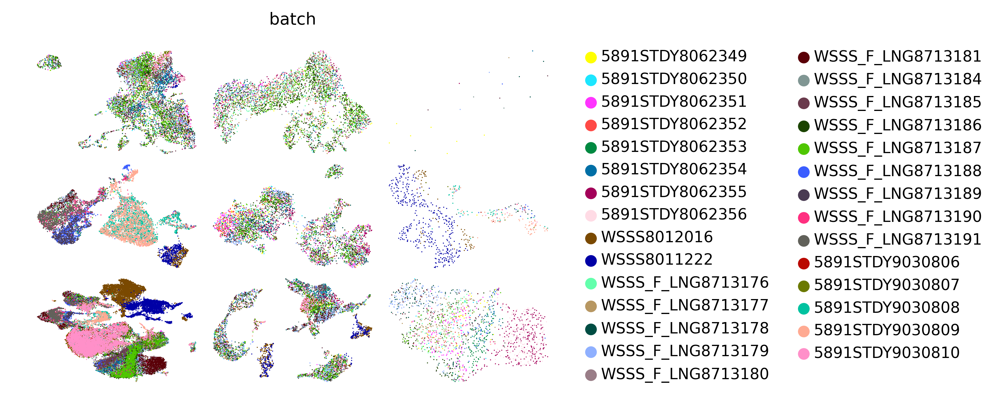

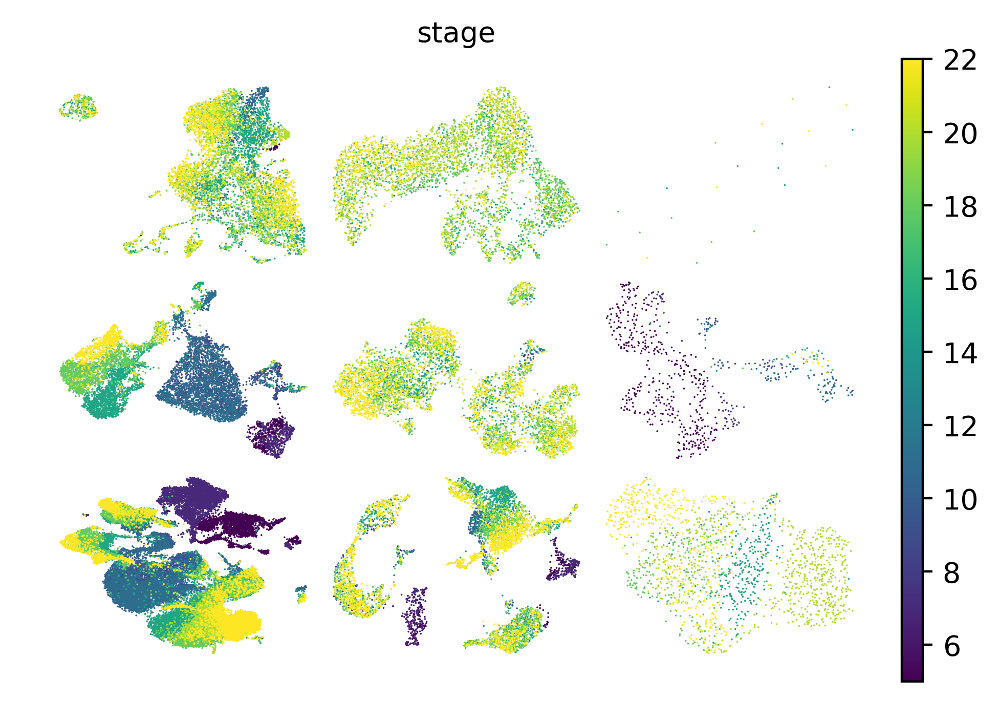

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


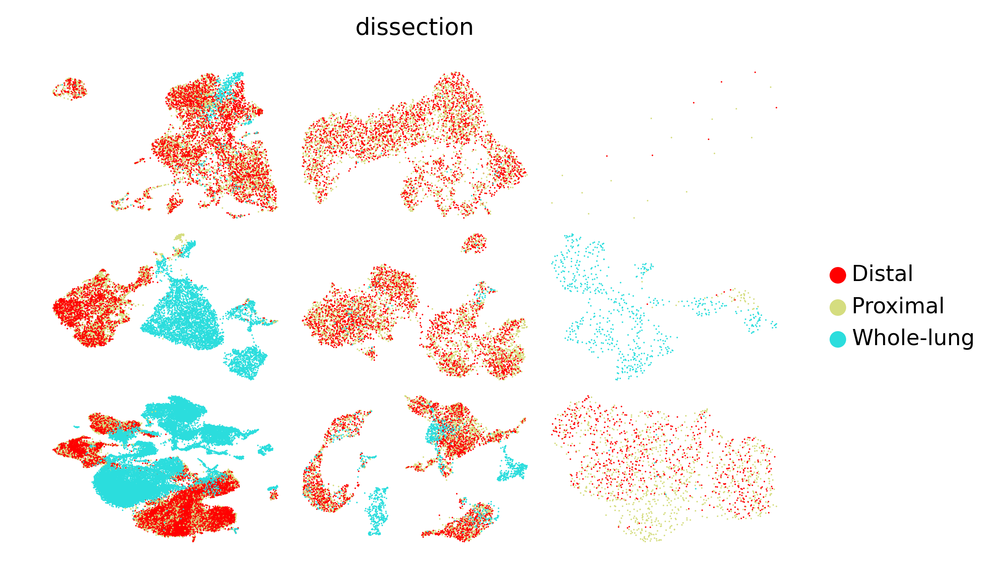

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


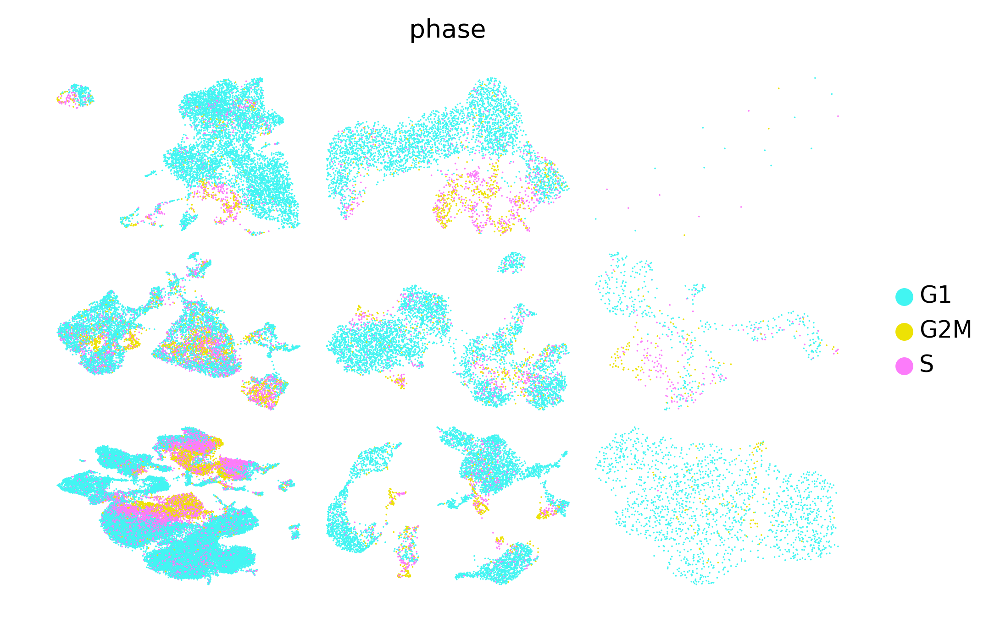

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


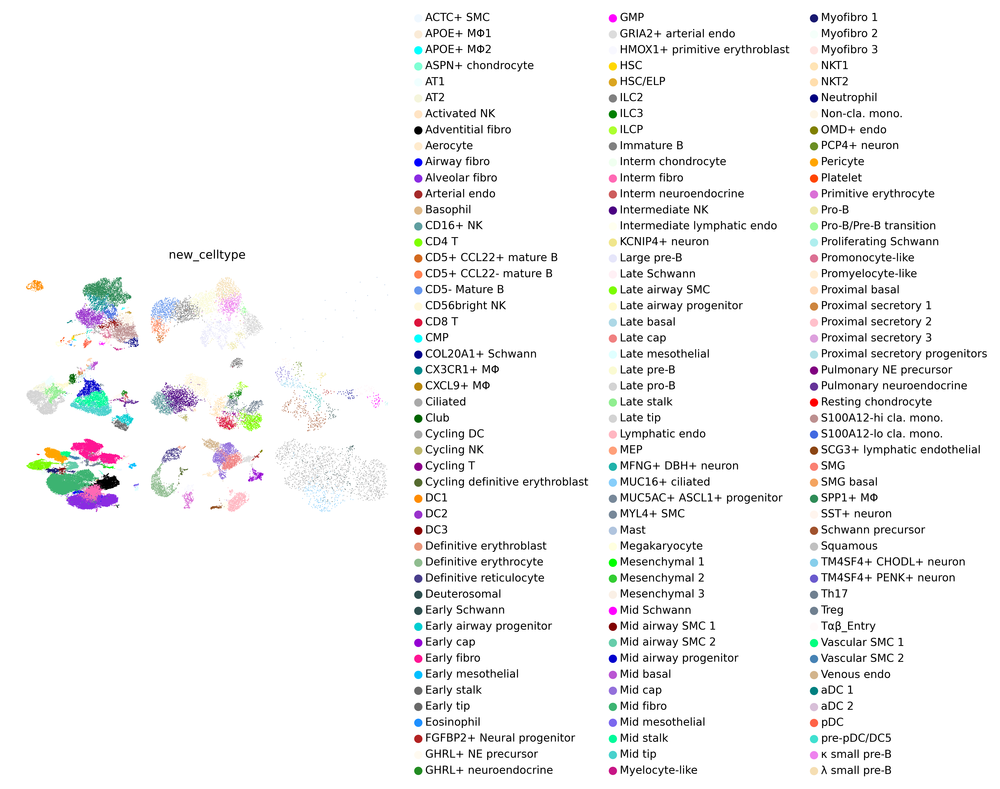

In [25]:
sc.pl.umap(adata_orig,color='batch')
sc.pl.umap(adata_orig,color='stage')
sc.pl.umap(adata_orig,color='dissection')
sc.pl.umap(adata_orig,color='phase')
sc.pl.umap(adata_orig,color='new_celltype',palette=list(matplotlib.colors.CSS4_COLORS.values()))

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


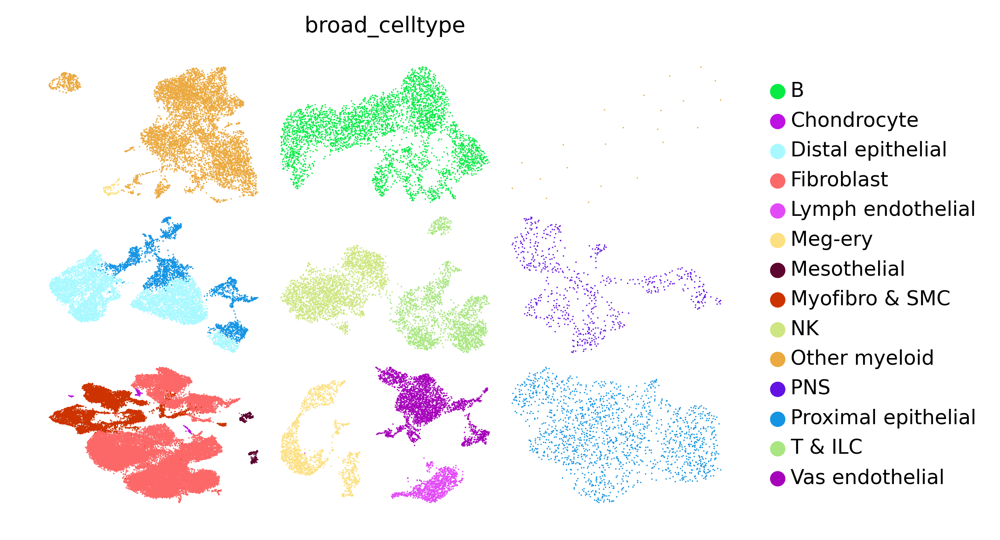

In [4]:
sc.pl.umap(adata,color='broad_celltype')

## inVAE training

In [3]:
data_dir = '/lustre/scratch126/cellgen/team292/ha10/data/Fetal_Lung/'
adata = sc.read(data_dir+'Assembled10DomainsFiltered.h5ad')

### filtering cell cycling genes

In [4]:
adata =adata[:,adata.var.highly_variable]
selected_genes = list(set(list(adata.var_names)+['CDK1','MKI67','CCNB2']))

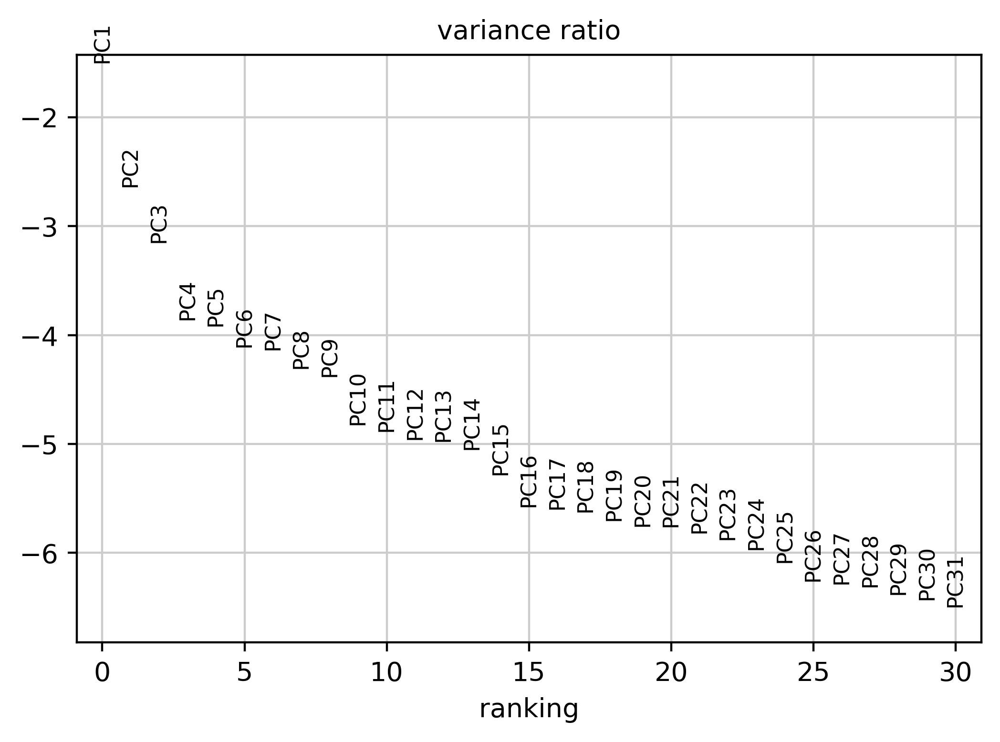

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/si

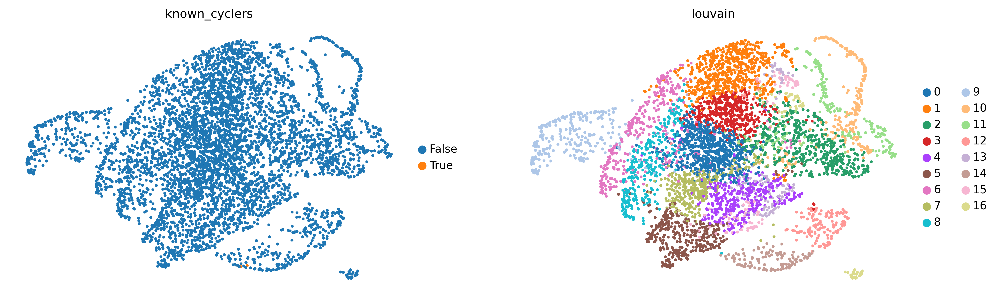

/nfs/team292/ha10/miniconda3/envs/data-an/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


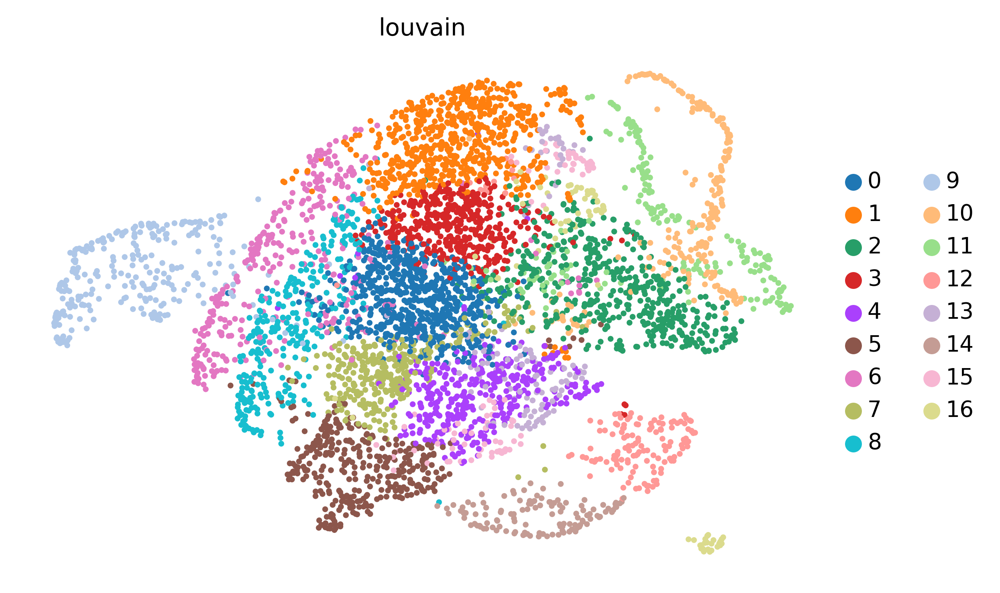

CDK1     14
MKI67    14
CCNB2    14
Name: louvain, dtype: category
Categories (17, object): ['0', '1', '2', '3', ..., '13', '14', '15', '16']


In [5]:
# Scale data to unit variance and zero mean
rdata = adata.copy().T
sc.pp.scale(rdata, max_value=10)

# Scatter plot in PCA coordinates
sc.tl.pca(rdata)
rdata.obsm['X_pca'] *= -1  # multiply by -1 to match Seurat
# Plot the variance ratio
sc.pl.pca_variance_ratio(rdata, log=True)

num_pcs = 15
# Compute a neighborhood graph of observations
sc.pp.neighbors(rdata, n_pcs=num_pcs)
# Embed the neighborhood graph using UMAP
sc.tl.umap(rdata)
# Cluster GENES into subgroups using louvain: resolution < 1 to find less clusters
sc.tl.louvain(rdata, resolution=1)

# Locate ccs cluster
rdata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in rdata.obs_names]
rdata.obs['known_cyclers'] = [ str(i) for i in  rdata.obs['known_cyclers']]
sc.pl.umap(rdata, color=['known_cyclers', 'louvain'], color_map='OrRd')
sc.pl.umap(rdata, color=['louvain'], color_map='OrRd')
print(rdata.obs.loc[[i in ['CDK1','MKI67','CCNB2','PCNA'] for i in rdata.obs_names],'louvain'])

In [6]:
ccgs_cl_1 = rdata.obs.loc['MKI67',['louvain']][0]
print('Cell cycle genes cluster is ' + ccgs_cl_1)

Cell cycle genes cluster is 14


In [7]:
ccgs_genes = list(rdata.obs[rdata.obs['louvain'] == ccgs_cl_1].index)
print(len(ccgs_genes))

121


In [8]:
data_dir = '/lustre/scratch126/cellgen/team292/ha10/data/Fetal_Lung/'
adata = sc.read(data_dir+'Assembled10DomainsFiltered.h5ad')
adata.raw = adata.copy()

cgenes = ['CDK1','MKI67','CCNB2']
sc.tl.score_genes(adata, cgenes,score_name='cycling',use_raw=True)
adata = adata[adata.obs.cycling<0.5]

In [9]:
test = np.array(adata.obs.n_counts)
counts = np.repeat(test, repeats=adata.shape[1], axis=0).reshape(test.shape[0],adata.shape[1])

adata.layers['counts'] = np.ceil((np.multiply(np.exp(adata.X.todense())-1, counts))/10000)

adata.layers['counts'] = adata.layers['counts'].astype(int)

In [11]:
adata.obs['study'] = ['5891' if x.startswith('5891') else 'WSSS_F' if x.startswith('WSSS_F') else 'WSSS80' for x in adata.obs.batch]

In [12]:
adata =adata[:,adata.var.highly_variable]
print(adata.shape)
adata = adata[:,[x for x in adata.var_names if x not in ccgs_genes]]
print(adata.shape)

(65564, 5101)
(65564, 4980)


In [14]:
# Define covariates for the invariant and spurious prior in the following way/structure
# cat = categorical, cont = continuous

# Covariates for the invariant prior
inv_covar_keys = {
    'cont': [],
    'cat': ['stage'] 
}

# Covariates for the spurious prior
spur_covar_keys = {
    'cont': [],
    'cat': ['study']
}

In [15]:
adata = adata[np.random.permutation(adata.obs_names)]

In [16]:
adata.layers['counts'] = adata.layers['counts'].astype(int)

In [17]:
# set the seeds for reproducibility
torch.manual_seed(100)
torch.cuda.manual_seed(100)
np.random.seed(100)

# train Factorized inVAE: FinVAE
model = FinVAE(
   adata = adata,
   layer = 'counts',
   inv_covar_keys = inv_covar_keys,
   spur_covar_keys = spur_covar_keys,
   inject_covar_in_latent= True,
   latent_dim_inv = 30, 
   latent_dim_spur = 0,
   n_layers = 2, 
   hidden_dim = 128,
   activation = 'relu', 
   slope = 0.1, # only needed when activation is Leaky ReLU ('lrelu')
   device = 'cuda', # or 'cpu' if no gpu is available
   normalize_constant = 1.0, 
   fix_mean_prior = True,
   fix_var_prior = True,
   decoder_dist = 'nb',
   batch_norm = True,
   kl_rate = 0.3,
   batch_size = 128,
   elbo_version = 'sample',
   batch_norm_prior = True,
   dropout_rate = 0.1
)


Injecting spurious covariates in the latent space! The latent_dim_spur are ignored and set to zero!
Data loading done!


In [18]:
model.train(
    n_epochs=120, 
    lr_train = 0.001, 
    weight_decay = 0.0001,
    log_dir = './test_invae/nf_invae',
    log_freq = 50, 
    print_every_n_epochs = 10,
)

Starting training of model:
	epoch 10/120 took 5.34s; loss: 1783.46
	epoch 20/120 took 5.3s; loss: 1773.45
	epoch 30/120 took 3.94s; loss: 1769.19
	epoch 40/120 took 3.69s; loss: 1766.52
	epoch 50/120 took 3.7s; loss: 1764.14
	epoch 60/120 took 3.68s; loss: 1762.71
	epoch 70/120 took 3.88s; loss: 1761.95
	epoch 80/120 took 3.95s; loss: 1761.14
	epoch 90/120 took 9.97s; loss: 1760.25
	epoch 100/120 took 3.15s; loss: 1759.81
	epoch 110/120 took 3.61s; loss: 1759.60
	epoch 120/120 took 2.53s; loss: 1759.09
Training done!


In [59]:
model.save('../models/model_fatal_lung_whole_30_0_stage_study_ncounts_nocg_nocc.pt')

Saving the pytorch module...
To load the model later you need to save the hyperparameters in a separate file/dictionary.


## Invariant data representation

In [18]:
#model.load('../models/model_fatal_lung_whole_30_0_stage_study_nocg_nocc.pt')

Loading the model from given checkpoint...


In [19]:
latent = model.get_latent_representation(adata,latent_type='inv')

Calculating latent representation of passed adata by trying to transfer setup from the adata the model was trained on!


In [21]:
adata.obsm['X_FinVAE_30_0_nocg_nocc'] = latent

sc.pp.neighbors(adata, use_rep='X_FinVAE_30_0_nocg_nocc')
sc.tl.umap(adata)

adata.write(data_dir+'adata_fatal_lung_whole_30_0_stage_study_nocg_nocc.h5ad')